# Applied Machine Learning - Decision Trees - Spaceship Dataset 2023
## By Mohsin Ali Mirza k200353

#Importing Kaggle Dataset

In [213]:
!pip install -q kaggle

In [214]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"k200353mohsin","key":"4a7b9c8fe08952790a409585d7bd4c03"}'}

In [215]:
 !mkdir ~/.kaggle
 !cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [216]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
 !kaggle datasets list

In [218]:
!kaggle competitions download -c spaceship-titanic

spaceship-titanic.zip: Skipping, found more recently modified local copy (use --force to force download)


In [16]:
! unzip spaceship-titanic.zip -d Dataset2

Archive:  spaceship-titanic.zip
  inflating: Dataset2/sample_submission.csv  
  inflating: Dataset2/test.csv       
  inflating: Dataset2/train.csv      


In [219]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,precision_score,recall_score,f1_score
from sklearn.model_selection import GridSearchCV
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import math
import matplotlib.pyplot as plt

#Preprocessing

In [220]:
df_train = pd.read_csv("Dataset2/train.csv")
df_train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [221]:
df_train.info(memory_usage=False)
df_train = df_train.dropna()
features_with_na = df_train.isnull().sum()
print("\n\n")
features_with_na

# for f in features_with_na:
#   avg = math.ceil(df_train[f].median())
#   df[f].fillna(avg_age,inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)




PassengerId     0
HomePlanet      0
CryoSleep       0
Cabin           0
Destination     0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
Name            0
Transported     0
dtype: int64

In [222]:
def preprocessing(df):
  # List of numerical variables
  numerical_features = df.select_dtypes(include=['int64','float64'])

  # List of categorical variables
  categorical_features = df.select_dtypes(include=[object,'bool'])
  categorical_features = categorical_features.drop(columns=['Name', 'Cabin','PassengerId'])

  # # Create a LabelEncoder object

  # # # Label encode the categorical features
  # for col in categorical_features:
  #   le = LabelEncoder()
  #   categorical_features[col] = le.fit_transform(categorical_features[col])

  df = pd.concat([numerical_features, categorical_features], axis=1)

  return df



In [223]:
# df = preprocessing(df_train)
#iloc [rows , columns]
df = pd.get_dummies(df_train.drop(columns=['Name', 'Cabin','PassengerId'],axis=1))
df.head()
X = df.drop(columns=['Transported'])
y = df['Transported']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

#Vanila Implementation

In [280]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

# #Predict the response for test dataset
y_pred = clf.predict(X_test)

In [281]:
pd.DataFrame(
    {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_pred, y_test, average="macro"),
        "Recall": recall_score(y_pred, y_test, average="macro"),
        "F1 Score": f1_score(y_pred, y_test, average="macro"),
    },
    index=["Decision Tree Results"],
)

,Accuracy,Precision,Recall,F1 Score
Decision Tree Results,0.754289,0.75389,0.754667,0.753955


[0.72786177 0.75161987 0.73650108 0.73866091 0.74675325 0.72727273
 0.71428571 0.74458874 0.76839827 0.70995671]
0.736589903976513
0.016670446475482898


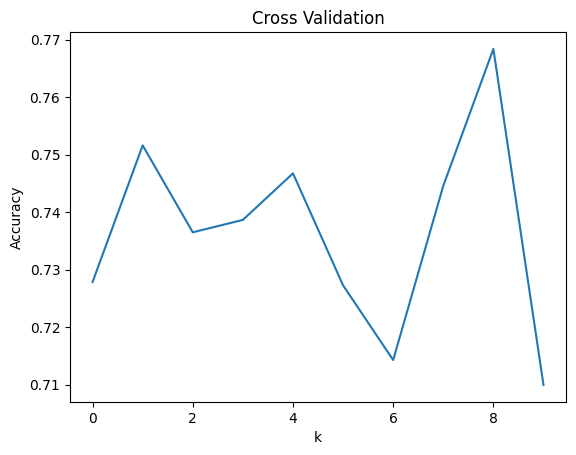

In [282]:
# cross validation
scores = cross_val_score(clf, X_train, y_train, cv=10)
print(scores)
print(scores.mean())
print(scores.std())

# plot
plt.plot(scores)
plt.title('Cross Validation')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.show()

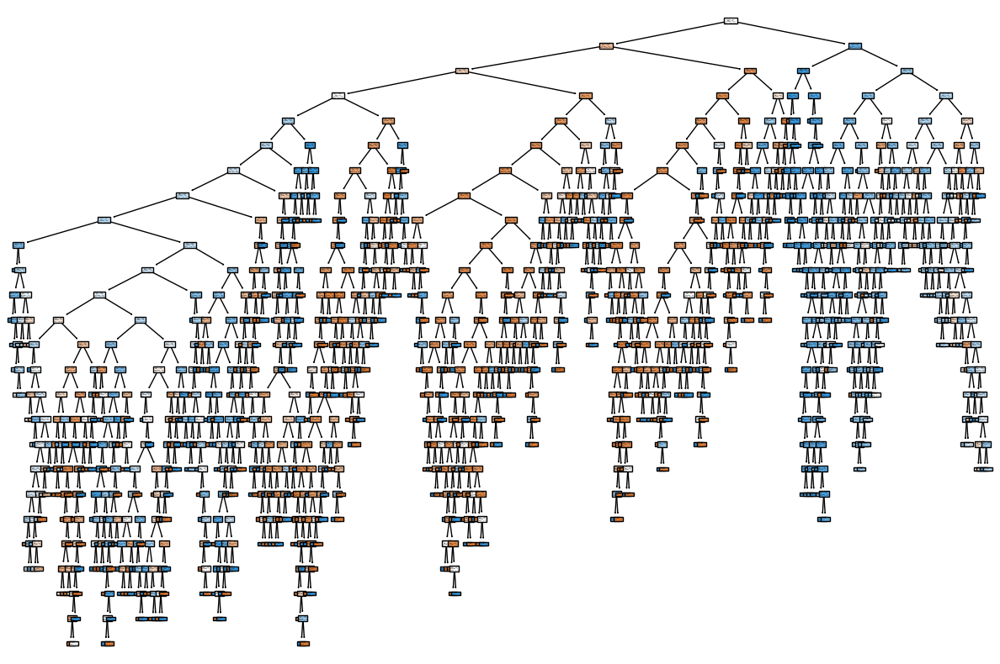

In [283]:
from sklearn import tree
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
tree.plot_tree(clf, filled=True)
plt.savefig('vanila.png', format='png')

#Method 1: Using Grid Search

Max Depth: The Maximum Depth we want to keep <br>
Min_Samples Split: Minimum samples we want to split at each step <br>
Min Leafs: Leaf Nodes at the final level. <br>
Criterion: Using Gini or Entropy <br>

In [287]:
param_grid = {
    "max_depth": [None, 5, 10, 20],
    "min_samples_split": [2, 5, 10, 20],
    "min_samples_leaf": [1, 2, 4, 8],
    "criterion": ["gini", "entropy"],
}

In [288]:
grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=10, n_jobs=-1, return_train_score=True)

clf = grid_search.fit(X_train, y_train)

params = grid_search.best_params_
model = grid_search.best_estimator_
y_pred = model.predict(X_test)

In [289]:
pd.DataFrame(
    {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_pred, y_test, average="macro"),
        "Recall": recall_score(y_pred, y_test, average="macro"),
        "F1 Score": f1_score(y_pred, y_test, average="macro"),
    },
    index=["Decision Tree Results"],
)

,Accuracy,Precision,Recall,F1 Score
Decision Tree Results,0.781029,0.779538,0.790365,0.778591


[0.79049676 0.7300216  0.78617711 0.76673866 0.75757576 0.75108225
 0.77705628 0.75324675 0.8030303  0.74242424]
0.7657849709685562
0.02192530238102274


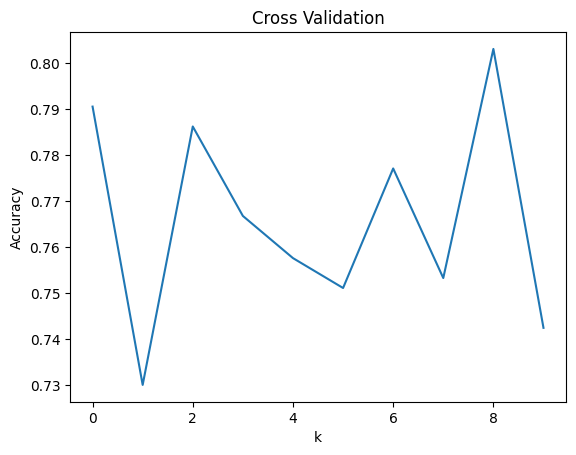

In [290]:
# cross validation
scores = cross_val_score(clf, X_train, y_train, cv=10)
print(scores)
print(scores.mean())
print(scores.std())

# plot
plt.plot(scores)
plt.title('Cross Validation')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.show()

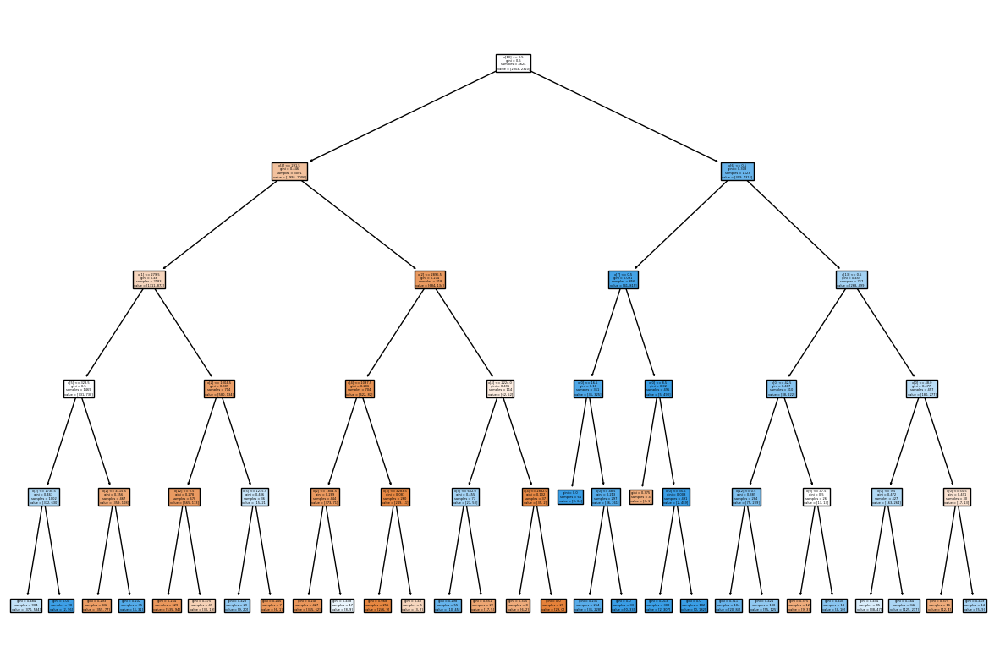

In [291]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(model,filled=True)
plt.savefig('grid.png', format='png')

# Method 2: Using Effective Alpha

In [226]:
!pip install matplotlib-venn

In [227]:
!pip install six
import six
import sys
sys.modules['sklearn.externals.six'] = six
from six import StringIO
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image
import pydotplus

In [228]:
feature_cols = X_train.columns

In [229]:
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Transported.png')
Image(graph.create_png())

In [245]:
clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

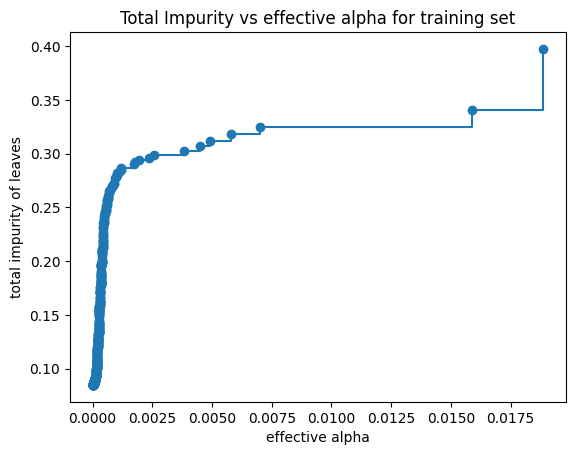

In [232]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [251]:
clfs = []
dim_ccp_alphas = []
for ccp_alpha in ccp_alphas:
    if ccp_alpha>0:
      clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
      clf.fit(X_train, y_train)
      clfs.append(clf)
      dim_ccp_alphas.append(ccp_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 3 with ccp_alpha: 0.018879882799354375


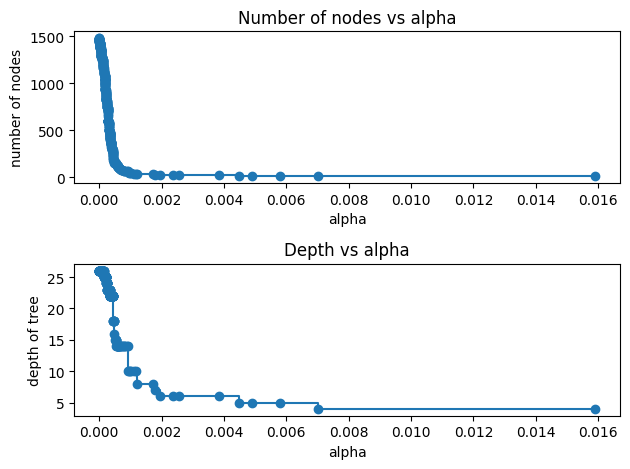

In [252]:
clfs = clfs[:-1]
ccp_alphas = dim_ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

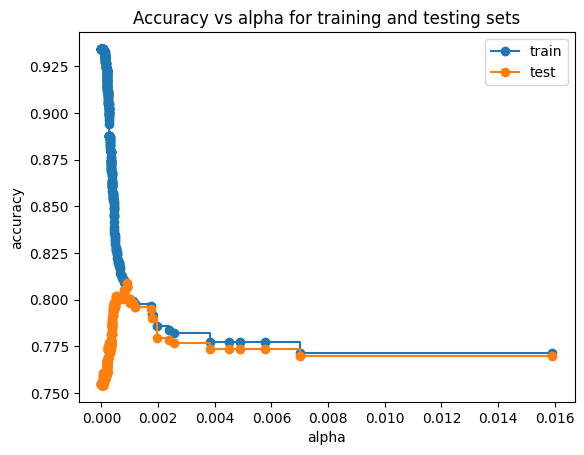

In [253]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [260]:
clf = DecisionTreeClassifier(random_state=0, ccp_alpha=0.018)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [261]:
pd.DataFrame(
    {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_pred, y_test, average="macro"),
        "Recall": recall_score(y_pred, y_test, average="macro"),
        "F1 Score": f1_score(y_pred, y_test, average="macro"),
    },
    index=["Decision Tree Results"],
)

,Accuracy,Precision,Recall,F1 Score
Decision Tree Results,0.769929,0.768794,0.774854,0.768343


[Text(0.5, 0.9, 'x[9] <= 0.5\ngini = 0.5\nsamples = 4624\nvalue = [2304, 2320]'),
 Text(0.3333333333333333, 0.7, 'gini = 0.308\nsamples = 1623\nvalue = [309, 1314]'),
 Text(0.6666666666666666, 0.7, 'x[4] <= 291.5\ngini = 0.446\nsamples = 3001\nvalue = [1995, 1006]'),
 Text(0.5, 0.5, 'x[1] <= 279.5\ngini = 0.48\nsamples = 2183\nvalue = [1311, 872]'),
 Text(0.3333333333333333, 0.3, 'x[5] <= 328.5\ngini = 0.5\nsamples = 1469\nvalue = [731, 738]'),
 Text(0.16666666666666666, 0.1, 'gini = 0.467\nsamples = 1002\nvalue = [372, 630]'),
 Text(0.5, 0.1, 'gini = 0.356\nsamples = 467\nvalue = [359, 108]'),
 Text(0.6666666666666666, 0.3, 'gini = 0.305\nsamples = 714\nvalue = [580, 134]'),
 Text(0.8333333333333334, 0.5, 'gini = 0.274\nsamples = 818\nvalue = [684, 134]')]

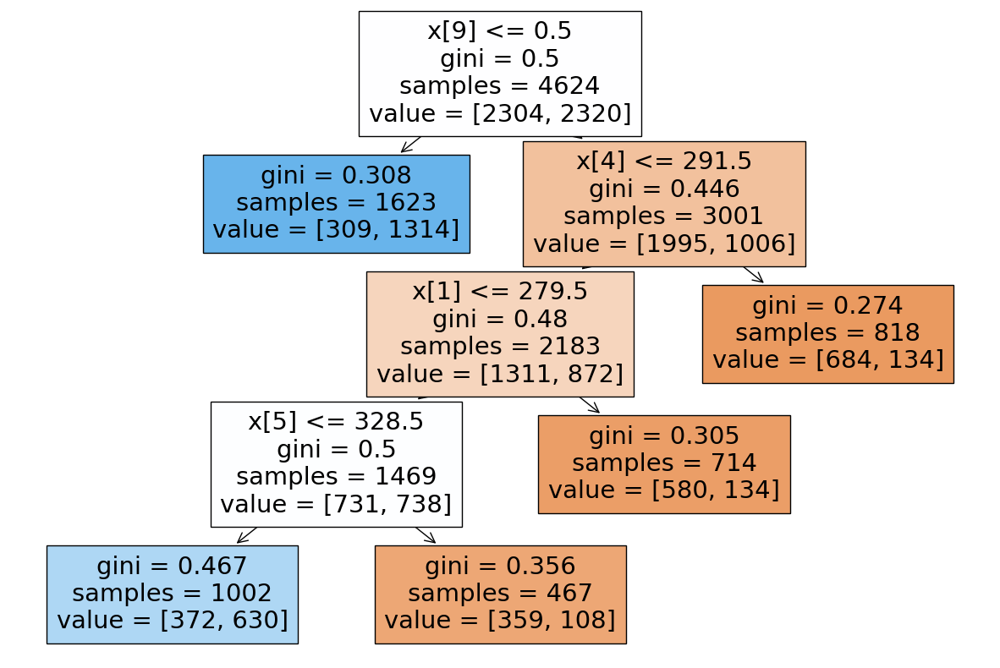

In [262]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(clf, filled=tree)

[0.78617711 0.73434125 0.77321814 0.7062635  0.74242424 0.71861472
 0.77489177 0.78571429 0.80519481 0.7034632 ]
0.753030303030303
0.03473297318564541


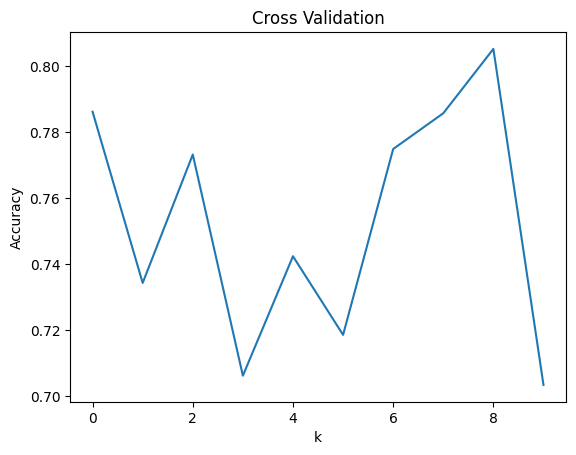

In [264]:
# cross validation
scores = cross_val_score(clf, X_train, y_train, cv=10)
print(scores)
print(scores.mean())
print(scores.std())

# plot
plt.plot(scores)
plt.title('Cross Validation')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.show()

# Conclusion

Step 1: Import Data from Kaggle <br>
Step 2: Import Libraries <br>
Step 3: Preprocessing - Removing Null Values & Cateogrical Data Encoding <br>
Step 4: Vanila Implementation Decision Tree <br>
Step 5: Grid Search Implementation <br>
Step 6: Effective Alpha Implementation <br>

---

#Results

**Grid Search > Effective Alpha > Vanila Implementation**

Grid Search:


| Method | Accuracy | Precision | Recall   | F1 Score | Cross Validation |
| ------ | ---------| --------- | -------  | -------- | ---------------  |
| Vanila | 0.781534 | 0.780035  | 0.790999 | 0.779077 | 0.736589         |
| Grid   | 0.781534 | 0.780035  | 0.790999 | 0.779077 | 0.765784         |
| Alpha  | 0.769929 | 0.768794  | 0.774854 | 0.768343 | 0.753030         |
